<a href="https://colab.research.google.com/github/z5165356/GP-Unet/blob/main/GP_UNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GPU runtime

In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Apr  4 04:11:04 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Import package

In [3]:
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import torch

import math
from PIL import Image
from IPython.display import display

from google.colab import drive
drive.mount('/content/drive')

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
cuda:0


In [4]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Dataset Loading from Drive

In [8]:
! mkdir BG
! cp /content/drive/MyDrive/PhD/dataset/MAS/BG.zip /content
! unzip /content/BG.zip -d /content/BG

!mkdir CS
! cp /content/drive/MyDrive/PhD/dataset/MAS/CS.zip /content
! unzip /content/CS.zip -d /content/CS

! cp /content/drive/MyDrive/PhD/dataset/MAS/MAS\ W2\ PVS\ rating\ FINAL.csv /content

! ls /content/BG/* | cut -d '/' -f 4 | cut -d '.' -f 1 | cut -d '_' -f 1  | awk '{print $1 "A"}'>> tmp

mkdir: cannot create directory ‘BG’: File exists
Archive:  /content/BG.zip
replace /content/BG/0022_BG.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
mkdir: cannot create directory ‘CS’: File exists
Archive:  /content/CS.zip
replace /content/CS/0022_CS.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Custom Image Dataset

In [5]:
import cv2
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms.functional as F
import math

class CustomImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, slice_type, transform=None, target_transform=None):
        df_num = pd.read_csv(annotations_file)
        df_num = df_num[df_num['ID'].notna()]
        with open('/content/tmp', 'r') as f:
          lines = f.readlines()

        lines = [elem.strip() for elem in lines]

        df_num = df_num[df_num['ID'].isin(lines)
        ]
        df_num.loc[:, 'ID'] = df_num['ID'].apply(lambda x: x.replace('A', ''))
        self.img_labels = df_num
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        self.slice_type = slice_type

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, str(self.img_labels.iloc[idx, 0])+'_'+self.slice_type+'.png')
        # Read a PIL image
        # Read the image
        orig_img = cv2.imread(img_path)
          
        # Convert BGR image to RGB image
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
          
        # Define a transform to convert
        # the image to torch tensor
        transform = transforms.Compose([
            transforms.ToTensor()
        ])
        image = transform(orig_img)
        
        size = image.shape[2]
        
        if size != 192:
          image = F.pad(image, [math.ceil((192-size)/2), math.floor((192-size)/2), 0, 0])

        label = self.img_labels.iloc[idx, 1].astype(np.float32)

        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

In [6]:
BG_dataset = CustomImageDataset('/content/MAS W2 PVS rating FINAL.csv', '/content/BG/', 'BG')
train_size = int(0.8 * len(BG_dataset))
test_size = len(BG_dataset) - train_size
BG_train_dataset, BG_test_dataset = torch.utils.data.random_split(BG_dataset, [train_size, test_size])

batch_size = 2
num_epochs = 5000

BG_train_dataloader = DataLoader(BG_train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
BG_test_dataloader = DataLoader(BG_test_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [7]:
# CS_dataset = CustomImageDataset('/content/MAS W2 PVS rating FINAL.csv', '/content/CS/', 'CS')
# train_size = int(0.8 * len(CS_dataset))
# test_size = len(CS_dataset) - train_size
# CS_train_dataset, CS_test_dataset = torch.utils.data.random_split(CS_dataset, [train_size, test_size])

In [8]:
! rm -r /content/MNIST

# Define model

In [9]:
import torch.nn as nn
import torch.nn.functional as F


class ConvReLu(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, kernel_size=(3, 3), padding=0):
        super().__init__()
        self.convrelu = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.convrelu(x)

class GPUnet(nn.Module):
    def __init__(self, printOn=True, regression=True):
        super().__init__()
        self.conv1 = ConvReLu(3, 32)
        self.conv2 = ConvReLu(32, 32)

        self.maxp1 = nn.MaxPool2d(2, 2)
        self.conv3 = ConvReLu(32, 64, (3, 3), padding=1)
        self.conv4 = ConvReLu(64, 64, (3, 3), padding=1)

        self.maxp2 = nn.MaxPool2d(2, 2)
        self.conv5 = ConvReLu(64, 128, (3, 3), padding=1)
        self.upsample1 = nn.Upsample(scale_factor=2)

        self.conv6 = ConvReLu(192, 64, (3, 3), padding=1)
        self.upsample2 = nn.Upsample(scale_factor=2)

        self.conv7 = ConvReLu(96, 32, padding=3)
        self.gap = nn.AvgPool2d(kernel_size=(256, 192))
        self.fc = nn.Linear(32, 1)

        self.printOn = printOn
        self.regression = regression

    def forward(self, x):
        if self.printOn:
          print('orig size', x.shape)

        x1 = self.conv1(x)
        if self.printOn:
          print(x1.shape)

        x1 = self.conv2(x1)
        if self.printOn:
          print('1 out', x1.shape)
        
        x2 = self.maxp1(x1)
        if self.printOn:
          print(x2.shape)
        
        x2 = self.conv3(x2)
        if self.printOn:
          print(x2.shape)
        
        x2 = self.conv4(x2)
        if self.printOn:
          print('2 out', x2.shape)

        x3 = self.maxp2(x2)
        if self.printOn:
          print(x3.shape)
        
        x3 = self.conv5(x3)
        if self.printOn:
          print(x3.shape)
        
        x3 = self.upsample1(x3)
        if self.printOn:
          print('3 out', x3.shape)

        x4 = torch.cat((x2, x3), dim=1)
        if self.printOn:
          print('concatenated', x4.shape)
        
        x4 = self.conv6(x4)
        if self.printOn:
          print(x4.shape)
        
        x4 = self.upsample2(x4)
        if self.printOn:
          print('4 out',x4.shape)

        x5 = torch.cat((x1, x4), dim=1)
        if self.printOn:
          print('concatenated', x5.shape)
        
        x5 = self.conv7(x5)
        if self.printOn:
          print('before GMP', x5.shape)
      
        if self.regression:
          x5 = self.gap(x5)

          if self.printOn:
            print('after GMP', x5.shape)

          batch_size = x.shape[0]
          x5 = self.fc(x5.view(batch_size, -1))

          if self.printOn:
            print(x5.shape)
        return x5

# tensor board

In [10]:
from torch.utils.tensorboard import SummaryWriter
import torchvision
import datetime
# default `log_dir` is "runs" - we'll be more specific here

current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'runs/pvs_experience/' + current_time + '/train'
test_log_dir = 'runs/pvs_experience/' + current_time + '/test'
train_summary_writer = SummaryWriter(train_log_dir)
test_summary_writer = SummaryWriter(test_log_dir)

In [11]:
current_time

'20220404-041118'

In [12]:
%reload_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

# Train model Testing

In [13]:
! pip3 install torchinfo

In [56]:
from torchvision import datasets, transforms
transform = transforms.Compose([
                                transforms.Grayscale(3),
                                transforms.ToTensor(),
                                # transforms.Normalize((0.5,), (0.5,)),
                                transforms.Resize((256, 192)),
                              ])


trainset = datasets.MNIST('/content/', download=True, train=True, transform=transform)
valset = datasets.MNIST('/content', download=True, train=False, transform=transform)
mnitrainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
mnivalloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=True)

In [15]:
# with torch.no_grad():
#   for image, label in valloader:
#     print(image[0].shape)
#     imshow(image[0])
#     pred = model(image.to(device))
#     print(pred)

# Train Model

# Define Parameters

In [16]:
model = GPUnet(printOn=False)
model = model.to(device)

params = {
    'batch_size': batch_size,
    'num_epochs': num_epochs,
}

train_params={
  'loss_function': torch.nn.MSELoss(),
  'learning_rate': 0.001,
  'optimiser': torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
  # 'optimiser': torch.optim.Adam(model.parameters(), weight_decay=0.0001)
}

from torchinfo import summary
summary(
    model,
    input_size=(params['batch_size'], 3, 256, 192),
    col_names=["output_size", "num_params"]
)

Layer (type:depth-idx)                   Output Shape              Param #
GPUnet                                   --                        --
├─ConvReLu: 1-1                          [2, 32, 254, 190]         --
│    └─Sequential: 2-1                   [2, 32, 254, 190]         --
│    │    └─Conv2d: 3-1                  [2, 32, 254, 190]         896
│    │    └─BatchNorm2d: 3-2             [2, 32, 254, 190]         64
│    │    └─ReLU: 3-3                    [2, 32, 254, 190]         --
├─ConvReLu: 1-2                          [2, 32, 252, 188]         --
│    └─Sequential: 2-2                   [2, 32, 252, 188]         --
│    │    └─Conv2d: 3-4                  [2, 32, 252, 188]         9,248
│    │    └─BatchNorm2d: 3-5             [2, 32, 252, 188]         64
│    │    └─ReLU: 3-6                    [2, 32, 252, 188]         --
├─MaxPool2d: 1-3                         [2, 32, 126, 94]          --
├─ConvReLu: 1-4                          [2, 64, 126, 94]          --
│    └─Sequ

In [17]:
import time

def train(trainloader, testloader):

  epoch = 0
  losses = []
  val_losses = []

  epochs_no_improvement = 0
  n_epochs_stop = 3
  # best_loss = float('inf')
  best_loss = 0

  if os.path.exists(save_PATH):

    checkpoint = torch.load(save_PATH)
    model.load_state_dict(checkpoint['model_state_dict'])
    train_params['optimiser'].load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    losses = checkpoint['losses']
    val_losses = checkpoint['val_losses']

    epoch+=1
    
    for i in range(epoch):
      train_summary_writer.add_scalar("Loss", losses[i], i)
      test_summary_writer.add_scalar("Loss", val_losses[i], i)
      train_summary_writer.flush()
      test_summary_writer.flush()
  print(epoch)
  # return

  while epoch < params['num_epochs']:
      #forward feed
      total_loss = 0
      print(epoch)
      start = time.time()
      for train_image, train_labels in trainloader:
        if 'cuda' in str(device):
          y_pred = model(train_image.cuda().requires_grad_())
          train_labels = train_labels.type(torch.cuda.FloatTensor)
        else:
          y_pred = model(train_image.requires_grad_())
          train_labels = train_labels.type(torch.FloatTensor)
        y_pred = y_pred[:, 0]
        
        #calculate the loss
        loss= train_params['loss_function'](y_pred, train_labels)
        # print(y_pred, train_labels, loss)
        total_loss+=loss.item()
        # #backward propagation: calculate gradients
        loss.backward()
        # #update the weights
        train_params['optimiser'].step()

        # #clear out the gradients from the last step loss.backward()
        train_params['optimiser'].zero_grad()
        # break

        # create grid of images
        img_grid = torchvision.utils.make_grid(train_image)

        # show images
        # print(epoch)
        print('epoch: ', epoch, y_pred, train_labels)
        # imshow(img_grid)
        # return
        train_summary_writer.add_image('batch_images', img_grid)

      losses.append(total_loss)

      total_val_loss = 0
      with torch.no_grad():
        for image, label in testloader:
          val_pred = model(image.to(device))
          val_pred = val_pred[:, 0]
          loss= train_params['loss_function'](val_pred, label.to(device))
          total_val_loss+=loss.item()

      ## Early Stopping
      if total_val_loss < best_loss:
        best_loss = total_val_loss.item()
        epochs_no_improvement = 0

      else:
        epochs_no_improvement+=1

      if epochs_no_improvement == n_epochs_stop:
        print('Early Stopping at epoch: ', epoch)
        break

      val_losses.append(total_val_loss)

      torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': train_params['optimiser'].state_dict(),
        'losses': losses,
        'val_losses': val_losses
      }, save_PATH)
      epoch+=1

      # write to tensorboard
      train_summary_writer.add_scalar("Loss", total_loss, epoch)
      test_summary_writer.add_scalar("Loss", total_val_loss, epoch)

      print('epoch: ', epoch, 'took ', time.time()-start)
      train_summary_writer.flush()
      test_summary_writer.flush()

In [18]:
save_PATH='/content/drive/MyDrive/PhD/testing_weight/MNIST_GPUnet.pt'
# train(mnitrainloader, mnivalloader)

In [21]:
# save_PATH='/content/drive/MyDrive/PhD/testing_weight/BG_GPUnet.pt'
# train(BG_train_dataloader, BG_test_dataloader)

In [22]:
train_summary_writer.close()
test_summary_writer.close()

# Inference

In [24]:
def get_attention_map(output, fc_weight):
  # print(fc _weight)
  result = 0
  for i, w in enumerate(fc_weight):
    feature_map = output[i]
    result = torch.add(torch.mul(feature_map, w), result)
  return result

In [25]:
def tensor_to_numpy(tensor):
  return tensor.cpu().detach().numpy()
  
def normalize_map(result):
    result = tensor_to_numpy(result)
    return result/np.max(result)

In [26]:
def normalize_image(image):
  image = tensor_to_numpy(image)
  for s in range(image.shape[2]):
    img_slice = image[:, :, s]
    image[:, :, s] = (img_slice-img_slice.min())/(img_slice.max() - img_slice.min())

  return image

In [527]:
## Code from https://github.com/jacobgil/pytorch-grad-cam/blob/master/pytorch_grad_cam/utils/image.py edited by Shizuka Hayashi

def show_cam_on_image(img: np.ndarray,
                      mask: np.ndarray,
                      use_rgb: bool = True,
                      colormap: int = cv2.COLORMAP_JET) -> np.ndarray:

    heatmap = cv2.applyColorMap(np.uint8(255 * mask), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    heatmap = np.float32(heatmap) / 255
    # display(Image.fromarray((heatmap*255).astype(np.uint8)))
    if np.max(img) > 1:
        raise Exception(
            "The input image should np.float32 in the range [0, 1]")
    cam = heatmap + img
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

In [528]:
def inference(testloader):
  model = GPUnet(printOn=False, regression=False)
  model.to(device)
  fc_weight = model.fc.weight.tolist()[0]
  checkpoint = torch.load(save_PATH)
  model.load_state_dict(checkpoint['model_state_dict'])

  test = GPUnet(printOn=False)
  test.to(device)
  checkpoint = torch.load(save_PATH)
  test.load_state_dict(checkpoint['model_state_dict'])

  for image, label in testloader:
    last_conv = model(image.to(device))

    batch_size = last_conv.shape[0]

    fig, ax = plt.subplots(math.ceil(batch_size/2), 2)

    for batch in range(batch_size):
      result = get_attention_map(last_conv[batch], fc_weight)
      result[result < 0] = 0

      normalized_map = normalize_map(result)
      normalized_image = normalize_image(image[batch].permute(1, 2, 0))
      
      cam_on_image = show_cam_on_image(normalized_image, normalized_map, use_rgb=True)
      display(Image.fromarray((normalized_map * 255).astype(np.uint8)))
      display(Image.fromarray((normalized_image * 255).astype(np.uint8)))
      display(Image.fromarray(cam_on_image))
      ax.ravel()[batch].imshow(cam_on_image)
    plt.show()
    print(test(image.to(device)))
    print(label)
    break


  return image, label, result

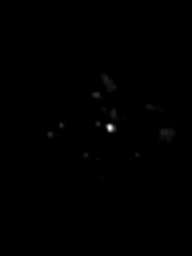

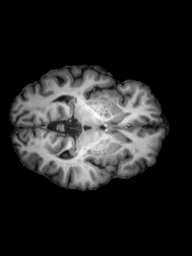

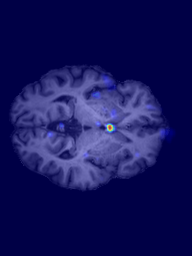

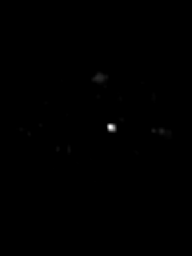

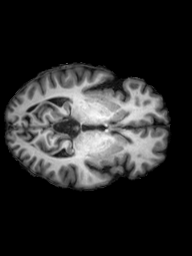

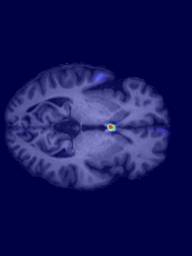

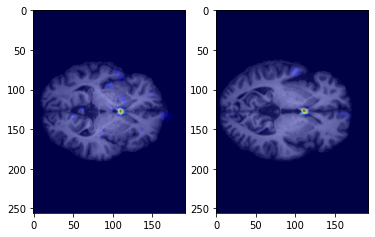

tensor([[6.7646],
        [3.3027]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([7., 3.])


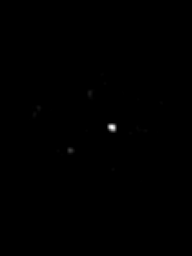

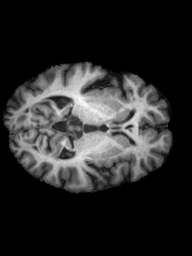

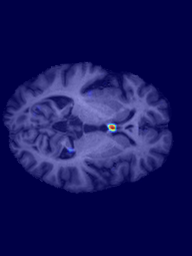

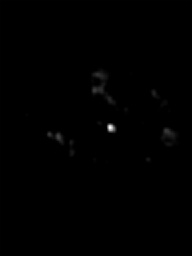

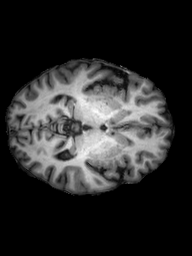

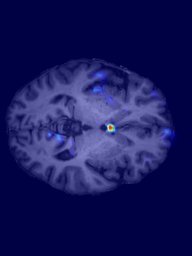

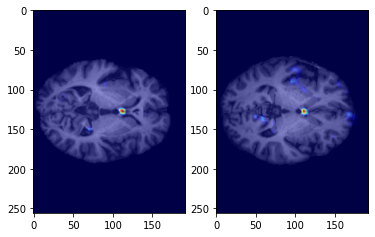

tensor([[ 1.4009],
        [10.0103]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([ 0., 10.])


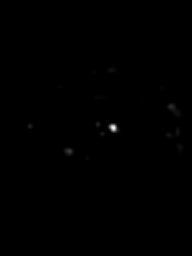

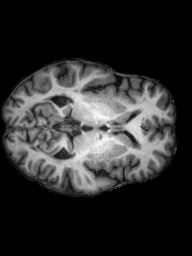

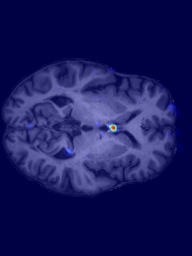

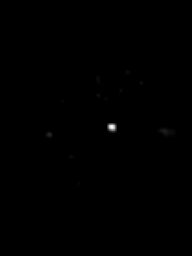

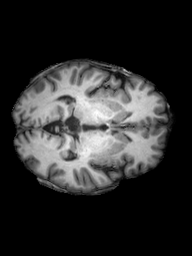

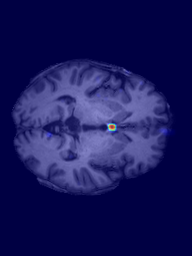

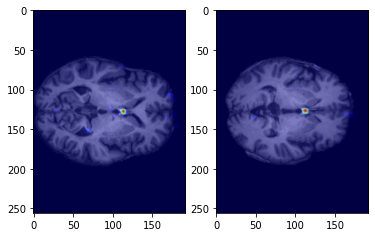

tensor([[4.5068],
        [1.8550]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([5., 2.])


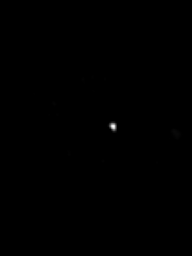

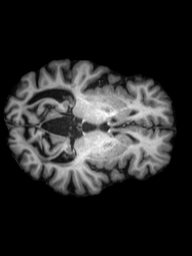

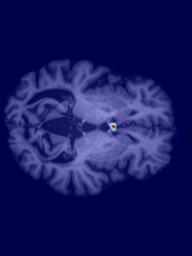

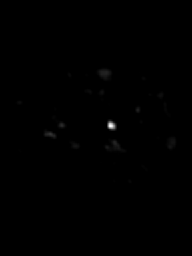

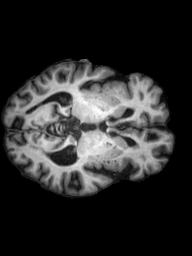

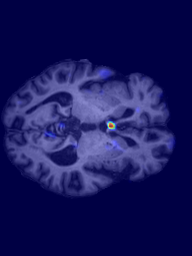

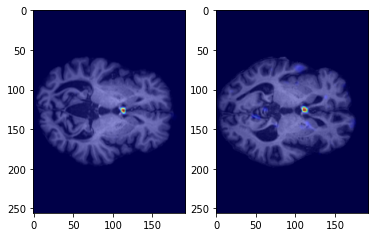

tensor([[0.1976],
        [5.6749]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([0., 6.])


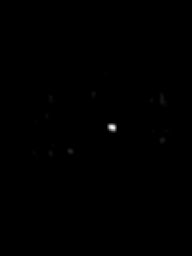

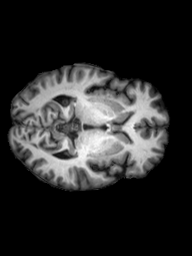

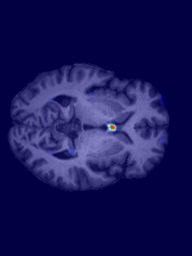

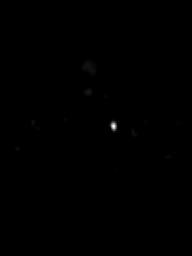

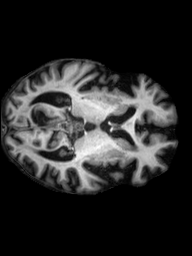

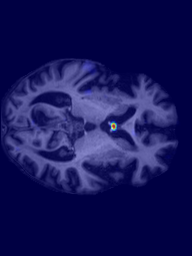

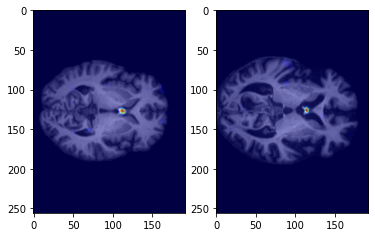

tensor([[1.9125],
        [2.2813]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 2.])


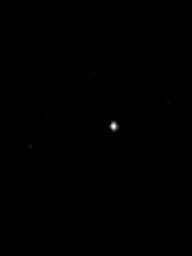

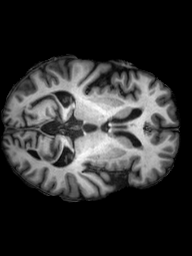

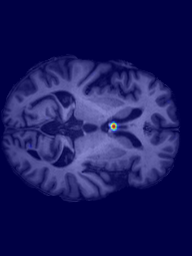

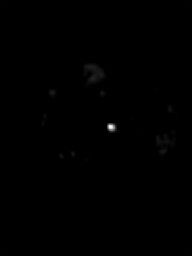

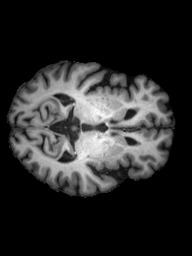

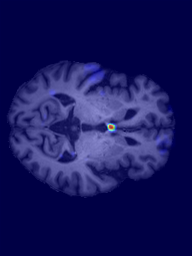

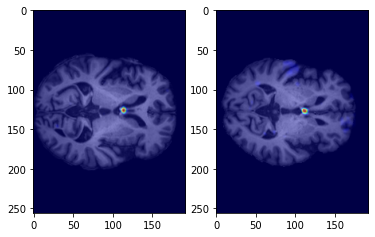

tensor([[0.6153],
        [5.9442]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([1., 6.])


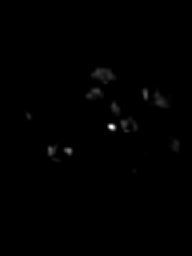

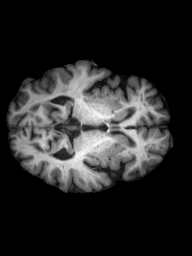

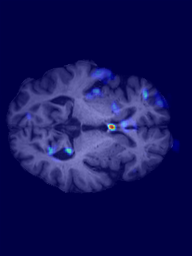

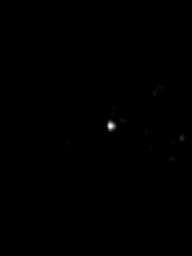

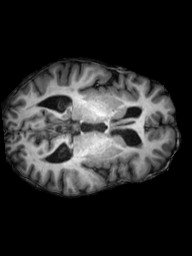

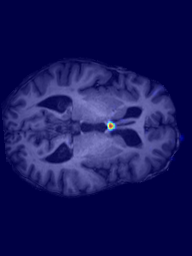

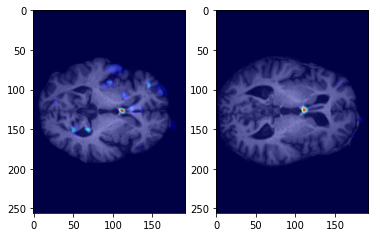

tensor([[14.1166],
        [ 1.9161]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([15.,  2.])


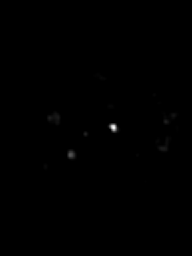

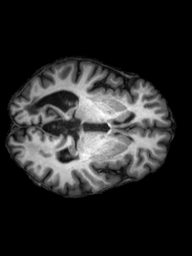

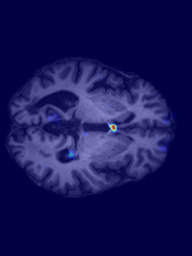

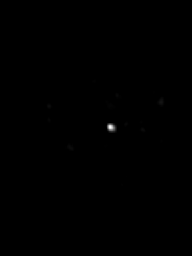

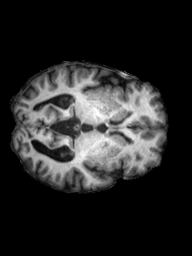

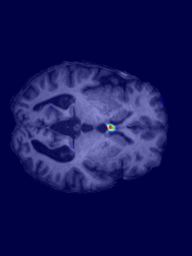

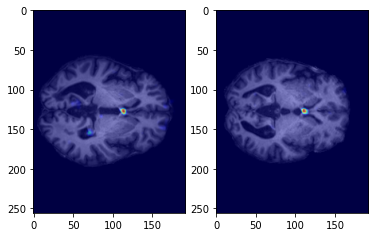

tensor([[4.4582],
        [0.6335]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 1.])


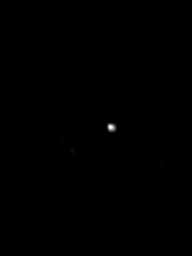

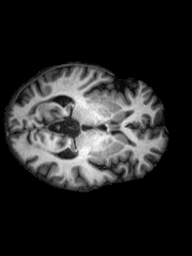

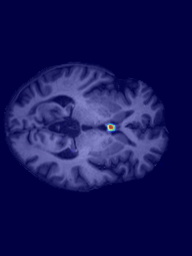

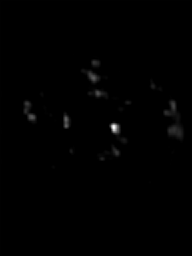

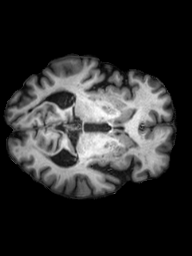

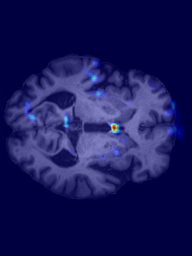

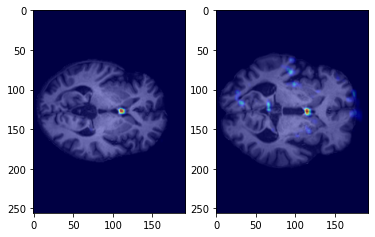

tensor([[ 0.1527],
        [13.8829]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([ 0., 14.])


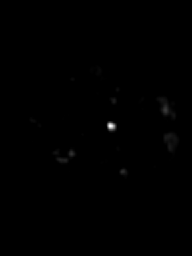

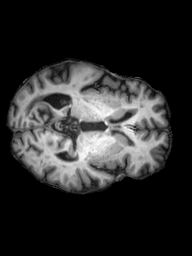

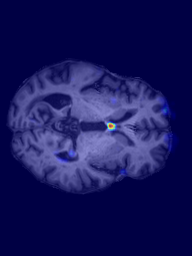

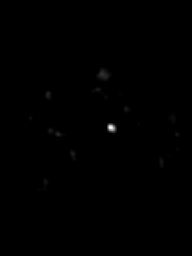

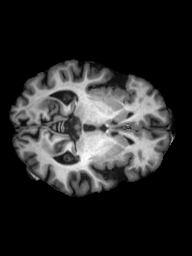

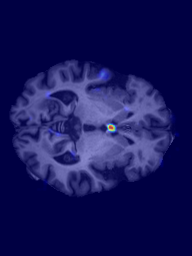

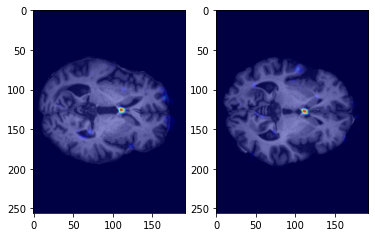

tensor([[6.9962],
        [4.8531]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([7., 5.])


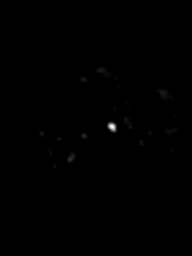

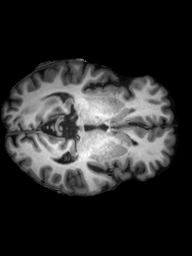

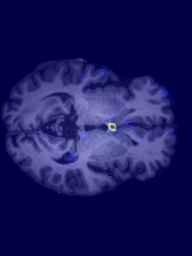

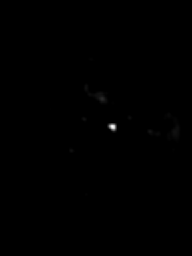

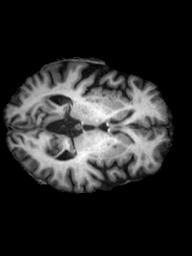

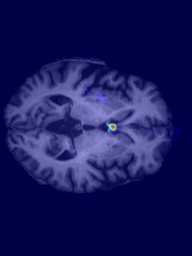

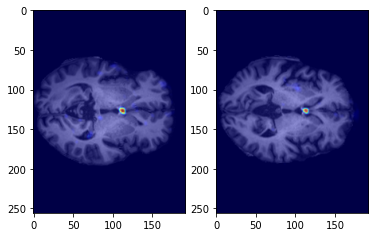

tensor([[4.6068],
        [2.9909]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 3.])


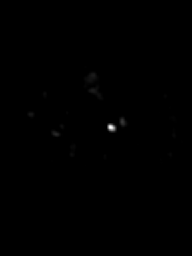

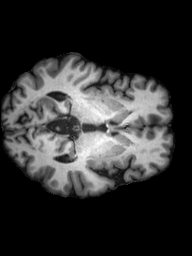

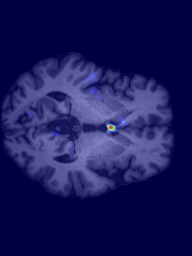

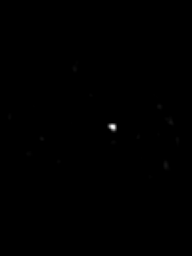

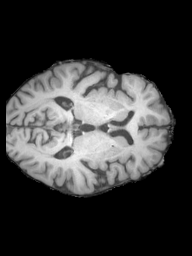

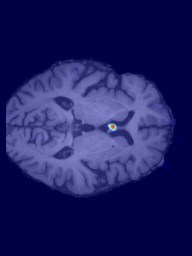

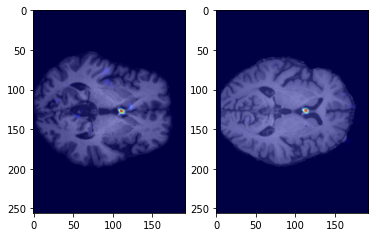

tensor([[4.5062],
        [0.9448]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([5., 1.])


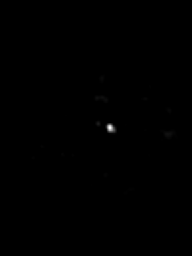

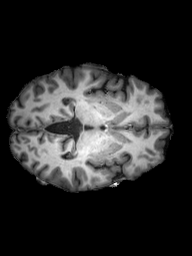

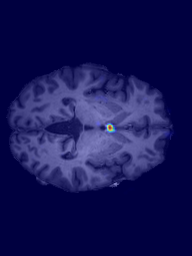

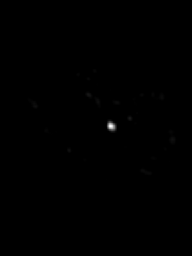

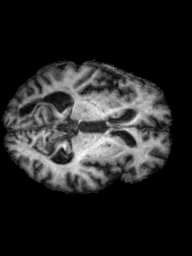

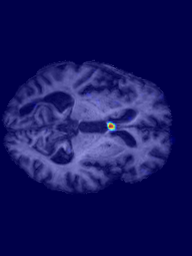

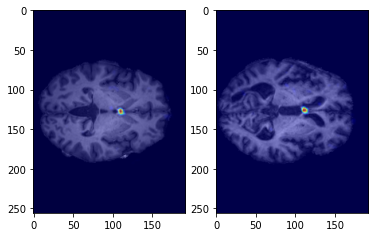

tensor([[1.9452],
        [1.8744]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 2.])


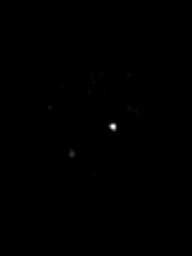

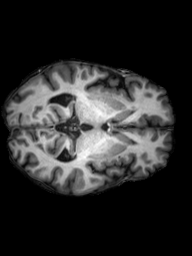

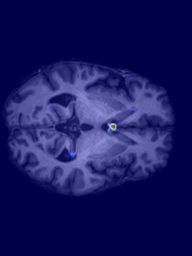

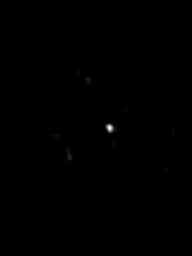

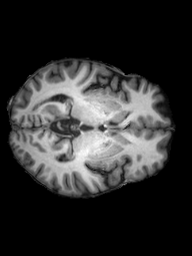

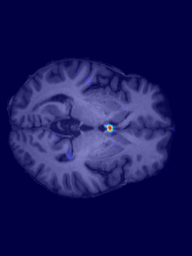

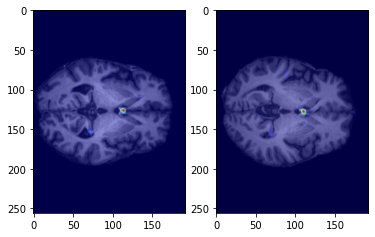

tensor([[0.9899],
        [2.2555]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([1., 2.])


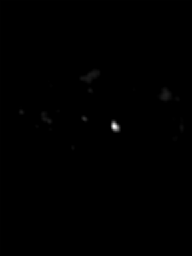

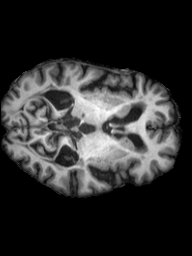

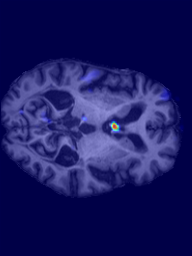

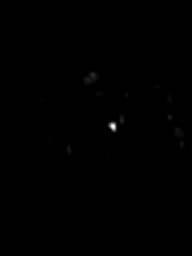

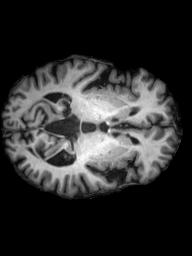

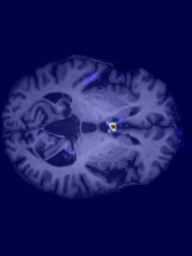

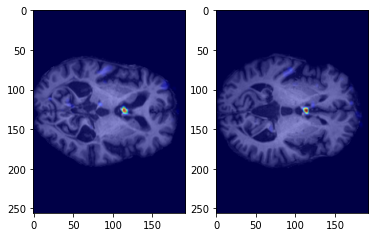

tensor([[5.0452],
        [3.7985]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([5., 4.])


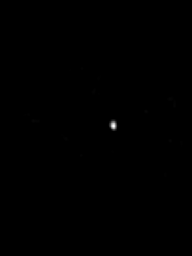

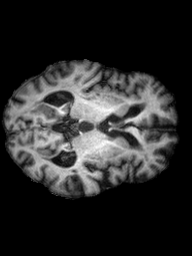

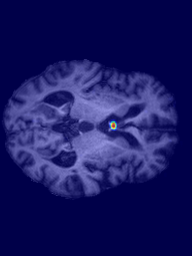

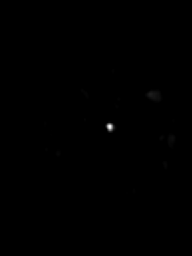

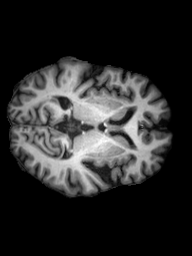

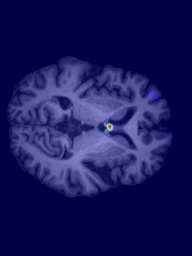

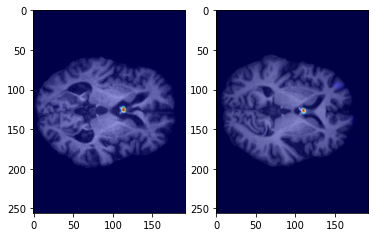

tensor([[0.0701],
        [1.9377]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([0., 1.])


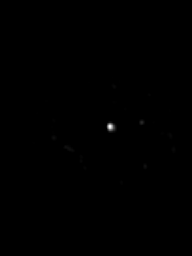

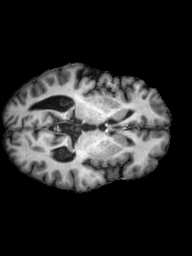

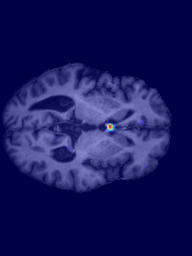

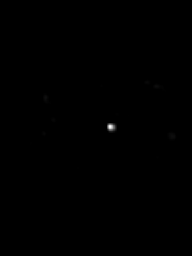

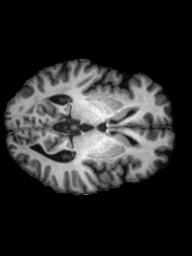

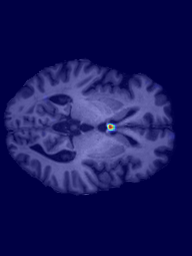

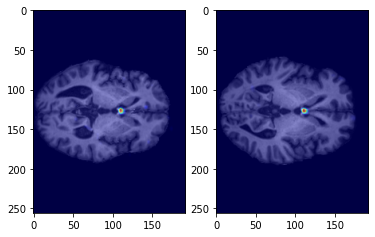

tensor([[0.9111],
        [0.8446]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([0., 1.])


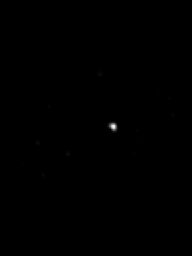

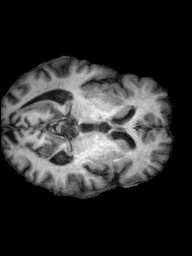

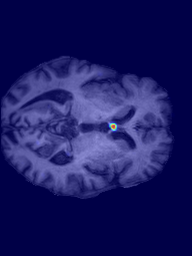

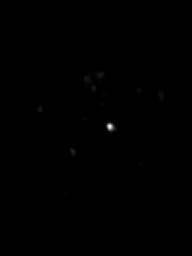

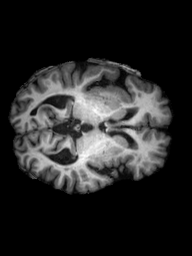

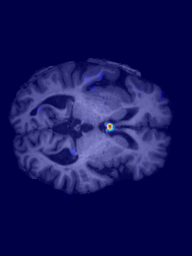

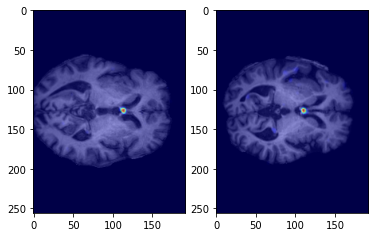

tensor([[0.4038],
        [3.0040]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([0., 5.])


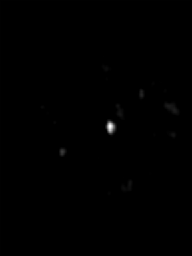

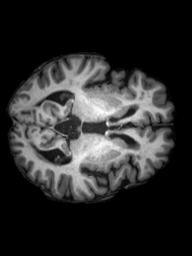

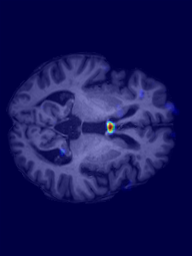

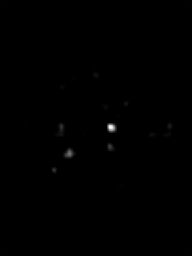

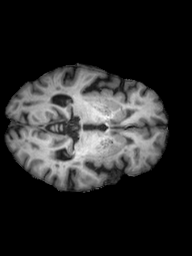

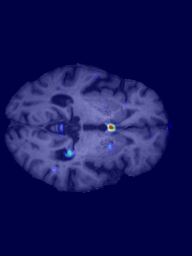

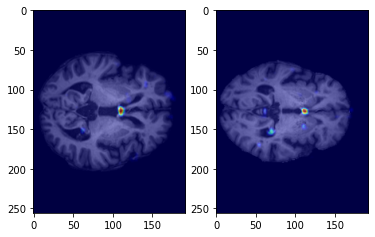

tensor([[4.7563],
        [4.5784]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([5., 5.])


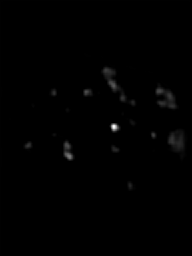

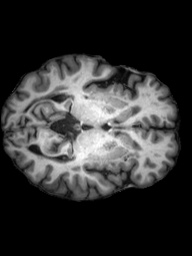

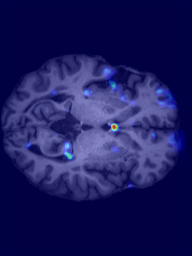

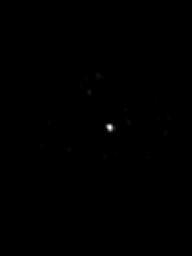

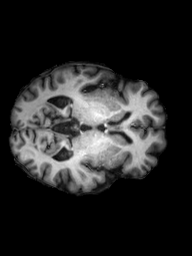

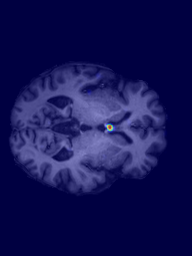

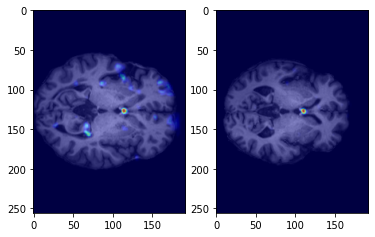

tensor([[15.2652],
        [ 0.9781]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([16.,  1.])


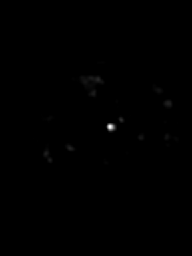

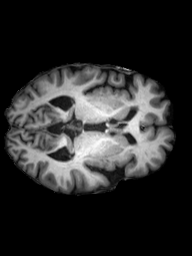

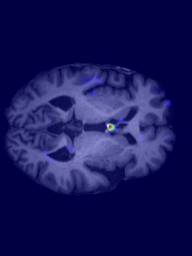

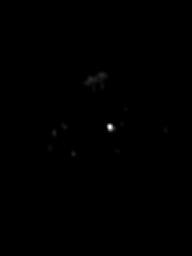

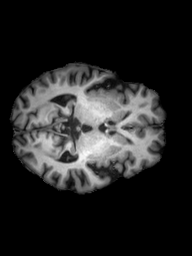

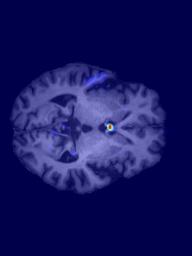

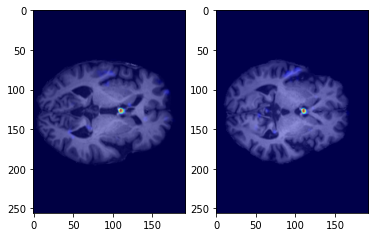

tensor([[5.7140],
        [3.7929]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 4.])


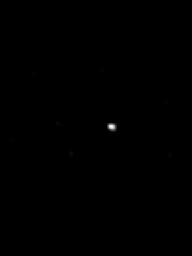

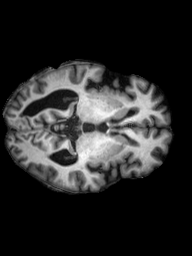

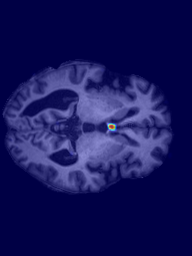

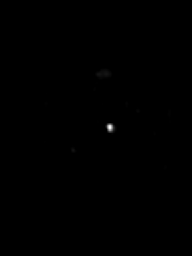

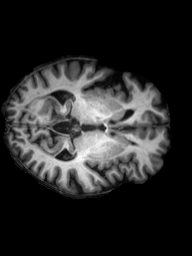

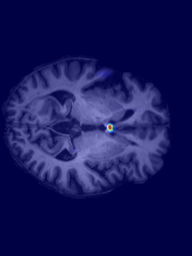

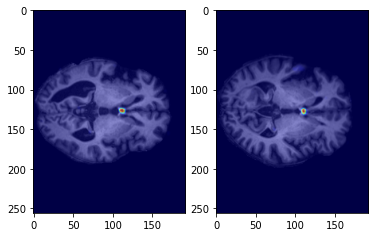

tensor([[0.1338],
        [0.9684]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([0., 1.])


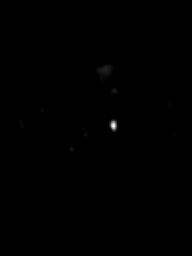

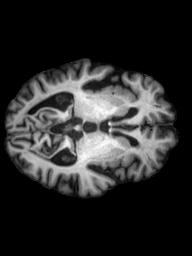

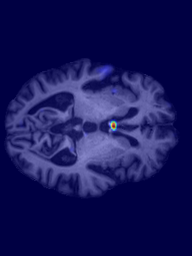

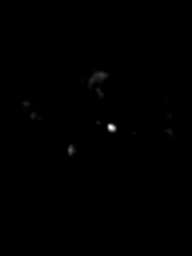

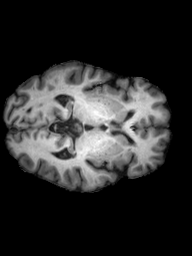

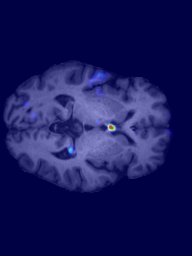

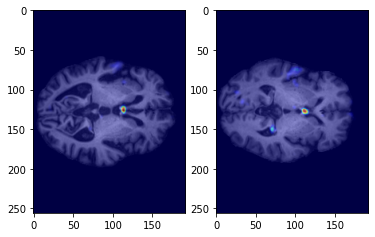

tensor([[3.0401],
        [5.5928]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([3., 6.])


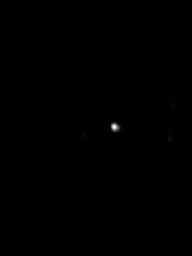

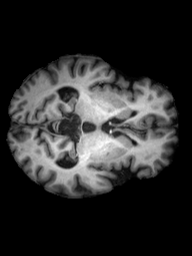

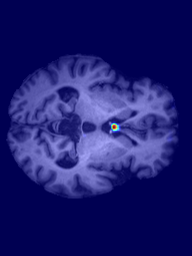

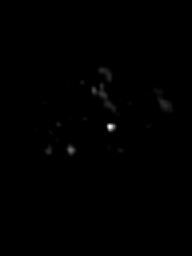

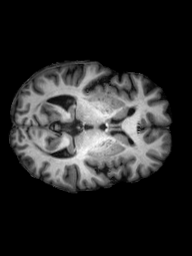

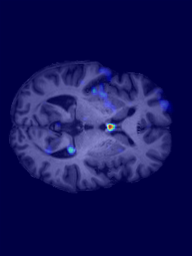

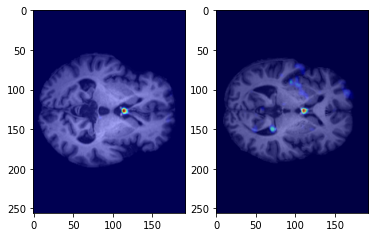

tensor([[1.0700],
        [8.8463]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([ 1., 10.])


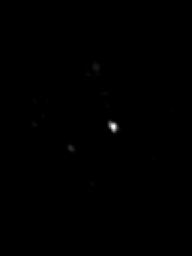

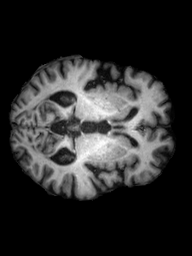

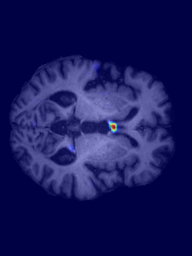

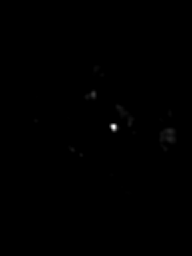

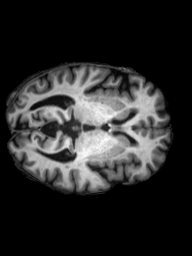

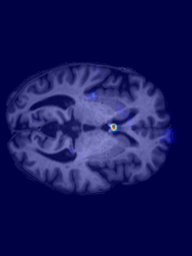

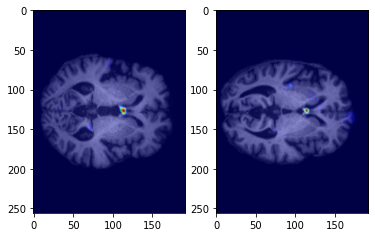

tensor([[2.8721],
        [4.3299]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 5.])


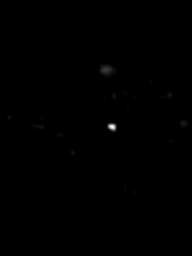

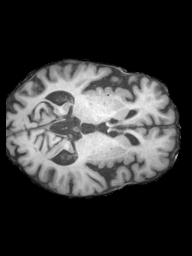

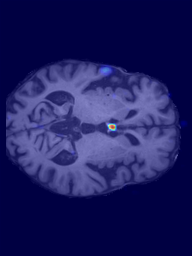

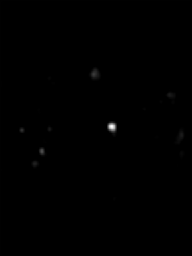

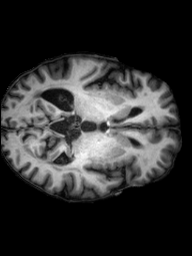

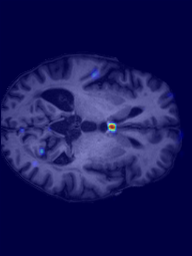

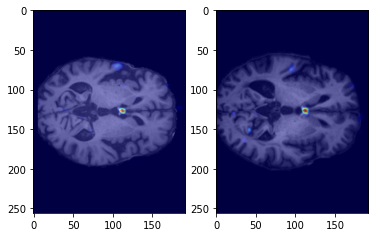

tensor([[3.7413],
        [4.2995]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 4.])


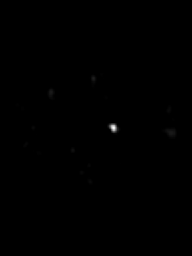

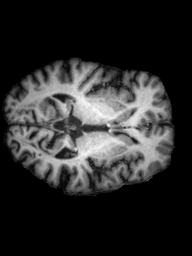

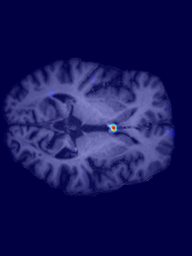

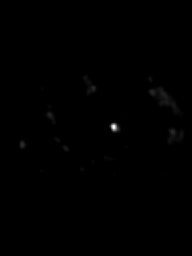

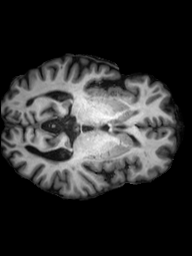

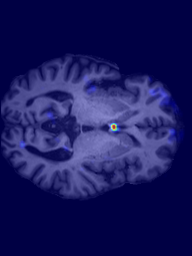

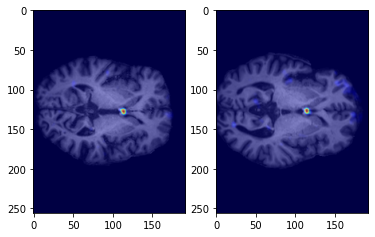

tensor([[2.2738],
        [8.1888]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 9.])


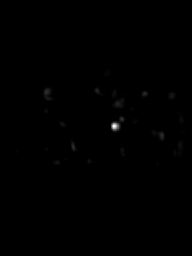

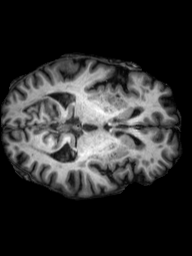

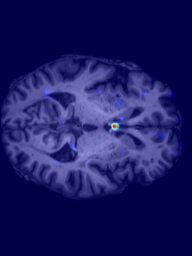

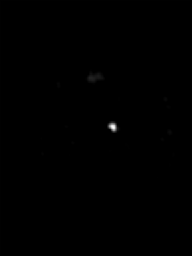

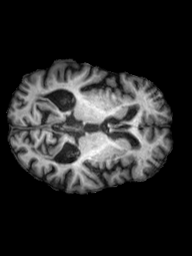

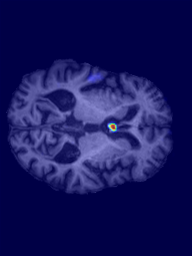

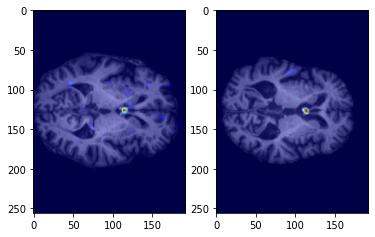

tensor([[6.0855],
        [2.2091]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([6., 2.])


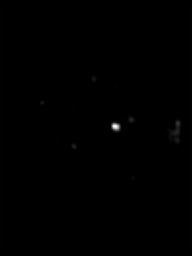

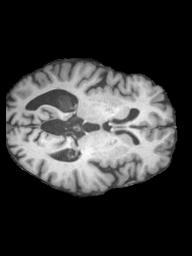

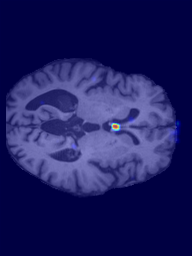

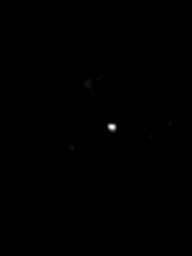

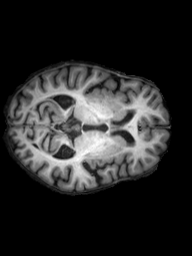

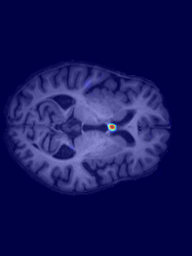

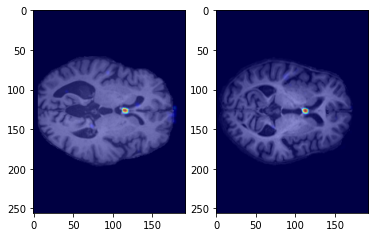

tensor([[3.3170],
        [1.1064]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([3., 1.])


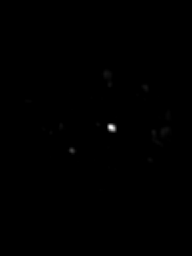

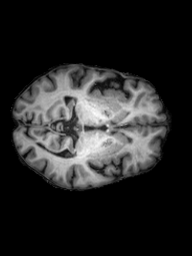

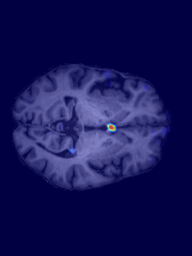

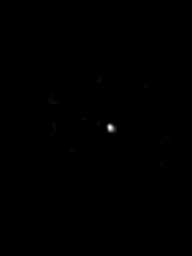

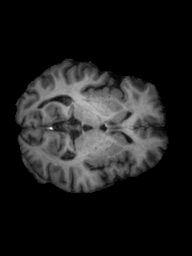

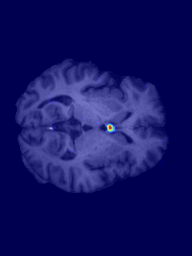

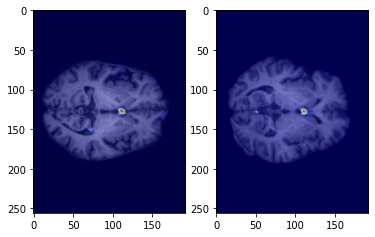

tensor([[3.9317],
        [0.5567]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 0.])


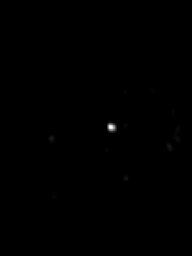

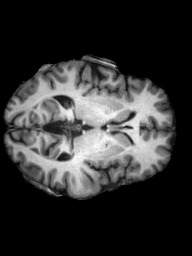

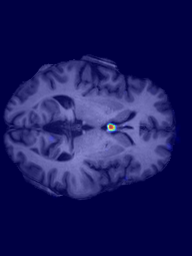

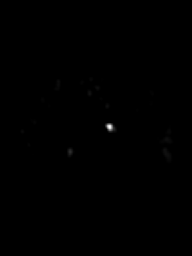

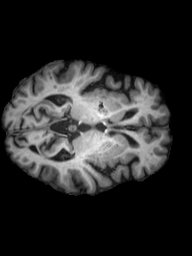

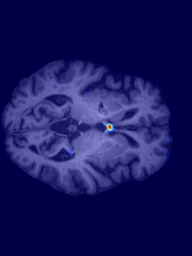

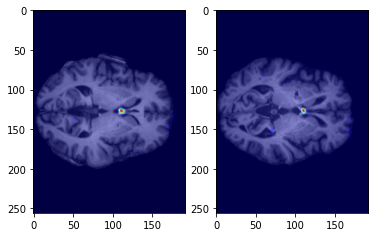

tensor([[1.9369],
        [2.1315]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([2., 2.])


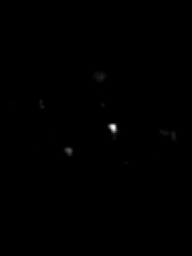

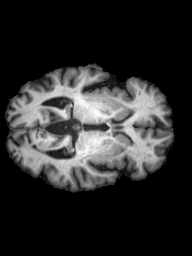

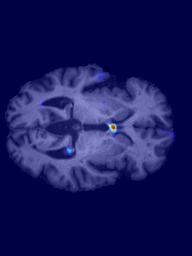

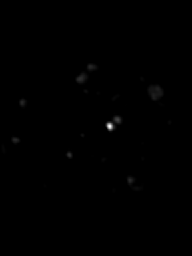

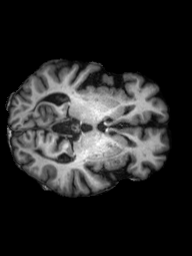

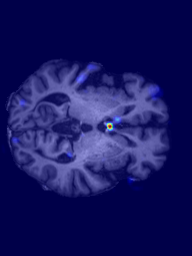

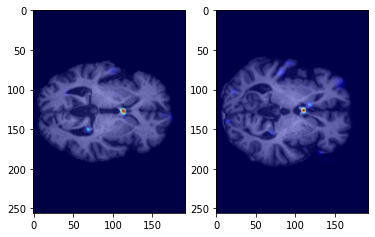

tensor([[3.9768],
        [7.4544]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 8.])


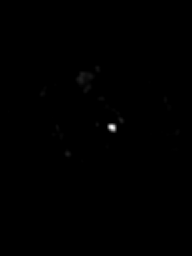

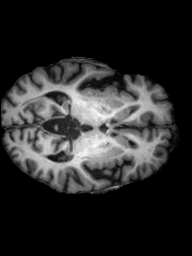

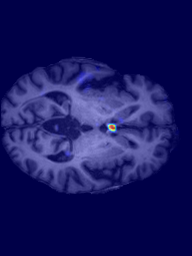

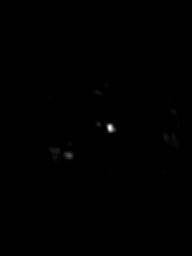

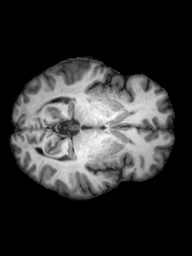

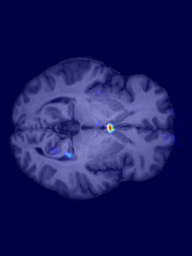

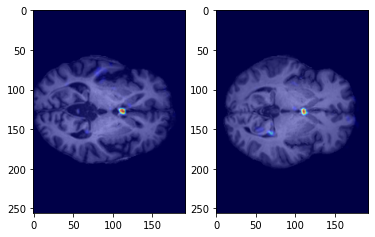

tensor([[3.6238],
        [4.5726]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 5.])


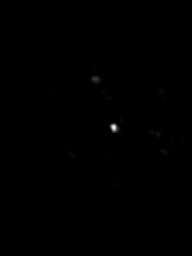

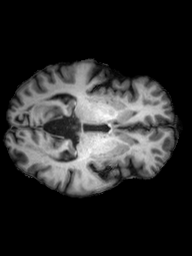

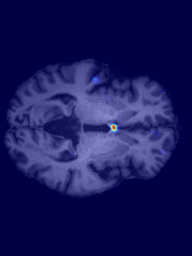

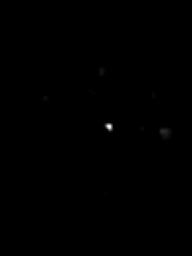

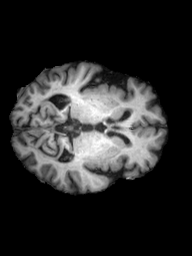

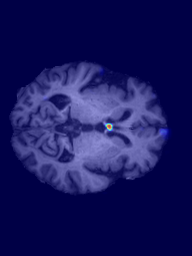

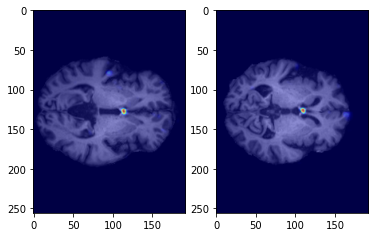

tensor([[2.6161],
        [1.6183]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([3., 2.])


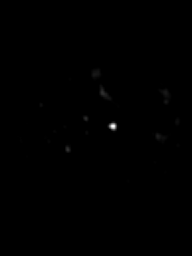

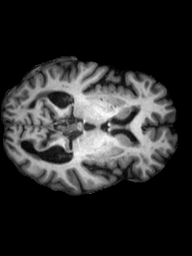

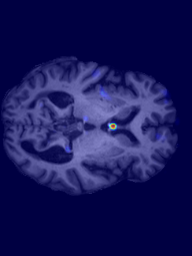

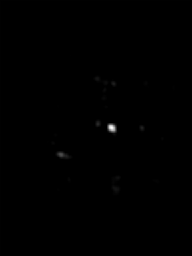

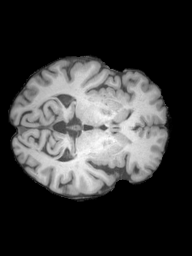

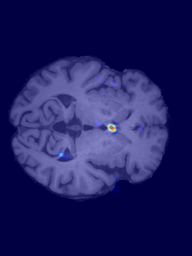

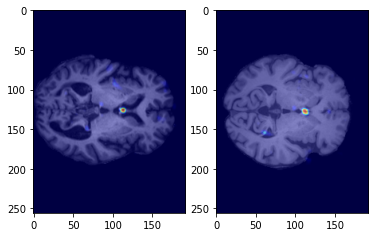

tensor([[3.9833],
        [3.6646]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 4.])


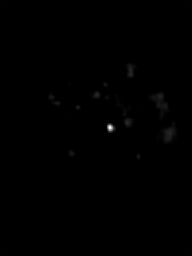

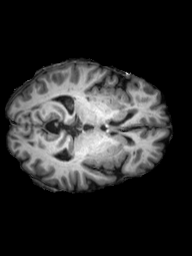

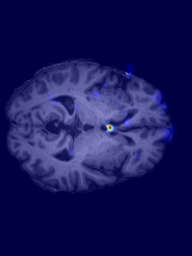

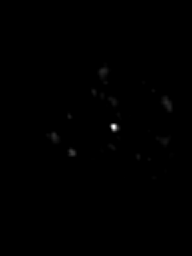

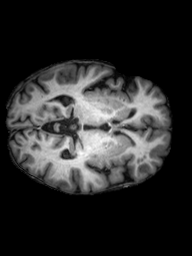

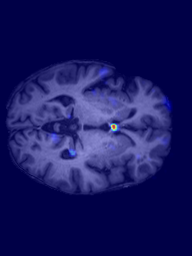

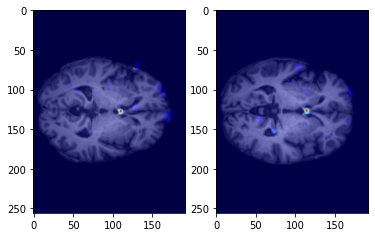

tensor([[7.4890],
        [8.0778]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([11.,  7.])


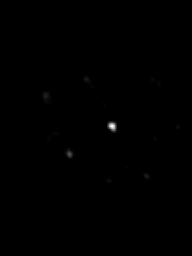

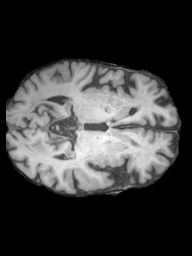

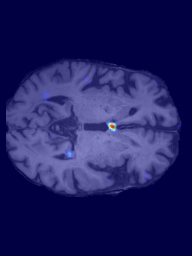

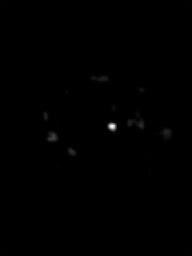

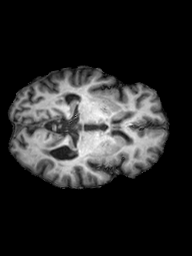

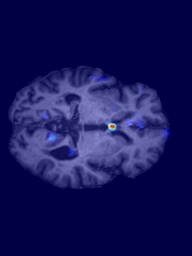

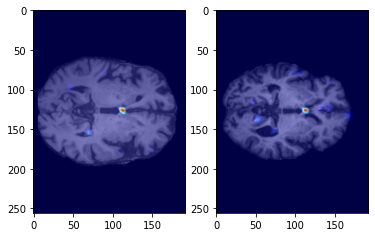

tensor([[3.3946],
        [6.4383]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([4., 6.])


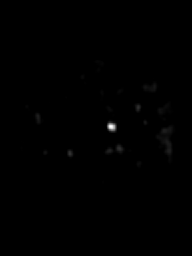

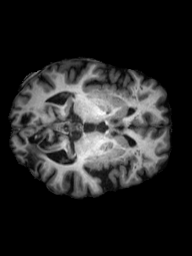

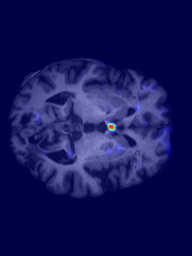

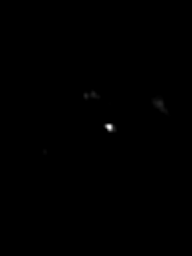

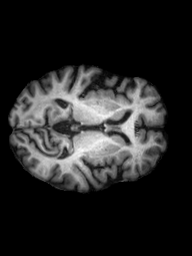

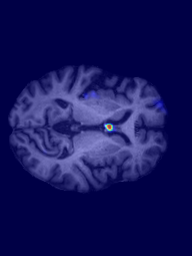

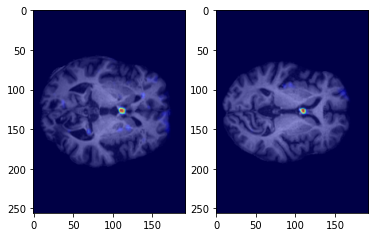

tensor([[7.2218],
        [2.4313]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([8., 3.])


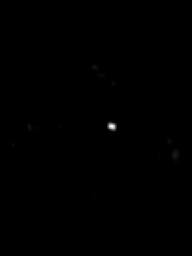

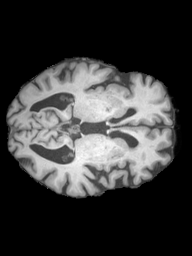

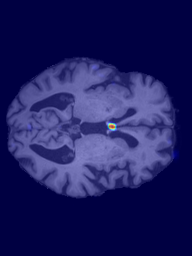

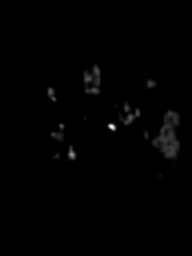

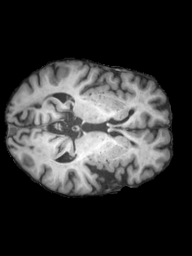

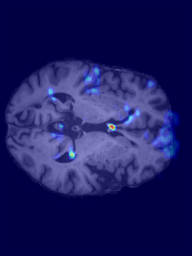

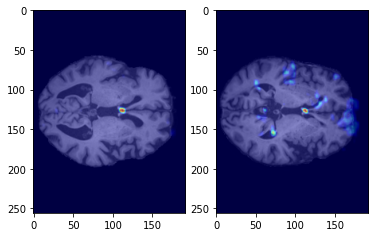

tensor([[ 1.9220],
        [19.1224]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([ 2., 20.])


In [529]:
image, label, attention_map = inference(BG_test_dataloader)

# Grad CAM

In [20]:
! git clone https://github.com/jacobgil/pytorch-grad-cam.git

fatal: destination path 'pytorch-grad-cam' already exists and is not an empty directory.


In [44]:
% cd /content/pytorch-grad-cam/
! pip install -r requirements.txt

/content/pytorch-grad-cam


In [46]:
import pytorch_grad_cam.utils.image

In [97]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

class CustomClassifierOutputTarget:
    def __init__(self, category):
        self.category = category
    def __call__(self, model_output):
        if len(model_output.shape) == 1:
            print(model_output[self.category])
            return model_output[self.category]
        return model_output[:, self.category]

def show_grad_cam(model, target_layers, image):
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)
  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=image, targets=[CustomClassifierOutputTarget(0), CustomClassifierOutputTarget(0)])
  # In this example grayscale_cam has only one image in the batch:
  visualization1 = show_cam_on_image(tensor_to_numpy(image[0].permute(1, 2, 0)), grayscale_cam[0, :], use_rgb=True)
  visualization2 = show_cam_on_image(tensor_to_numpy(image[1].permute(1, 2, 0)), grayscale_cam[1, :], use_rgb=True)
  fig, ax = plt.subplots(2, 3, figsize=(20, 20))
  ax.ravel()[0].imshow(visualization1)
  ax.ravel()[1].imshow(grayscale_cam[0, :]*255, cmap='gray')
  ax.ravel()[2].imshow(tensor_to_numpy(image[0].permute(1, 2, 0)))

  ax.ravel()[3].imshow(visualization2)
  ax.ravel()[4].imshow(grayscale_cam[1, :]*255, cmap='gray')
  ax.ravel()[5].imshow(tensor_to_numpy(image[1].permute(1, 2, 0)))

  plt.show()

tensor(0.) tensor(1.)
tensor(2.0701, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(1.7947, device='cuda:0', grad_fn=<SelectBackward0>)


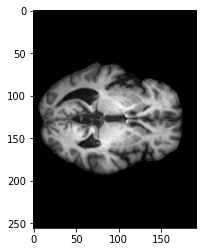

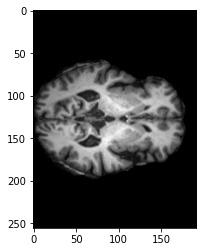

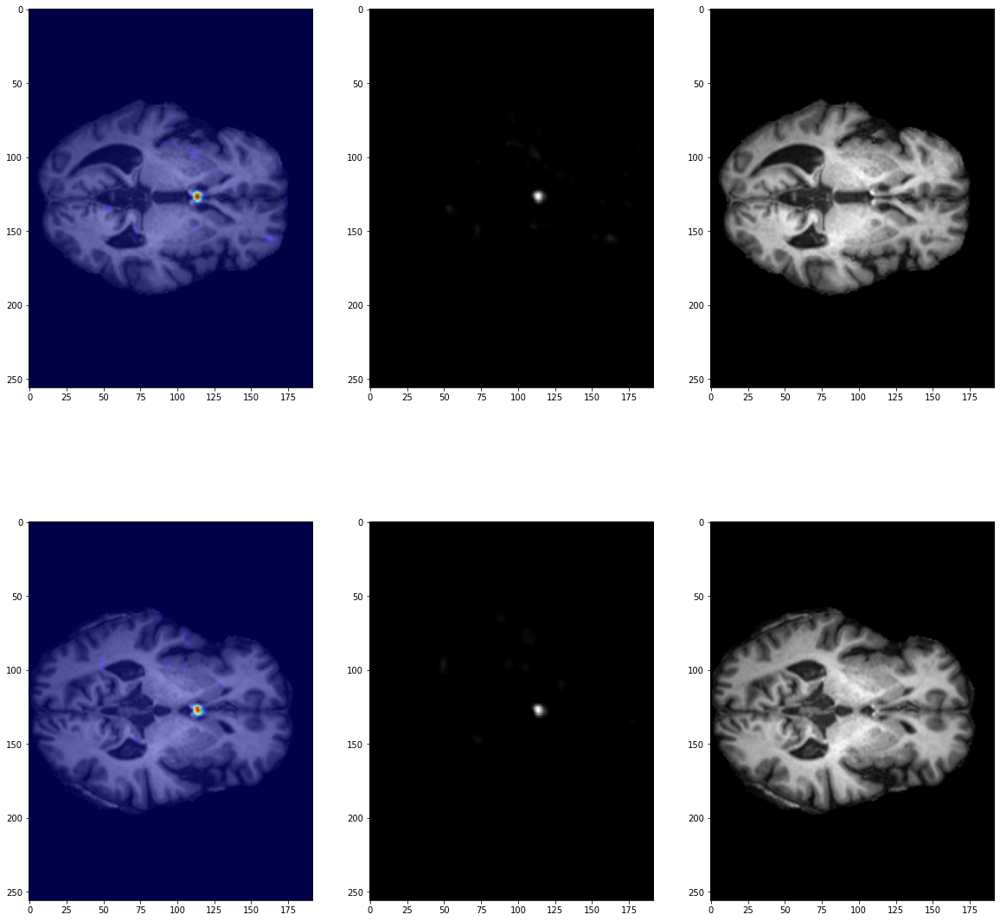

tensor([2., 2.])


In [98]:
save_PATH='/content/drive/MyDrive/PhD/testing_weight/BG_GPUnet.pt'
model = GPUnet(printOn=False, regression=True)
model.to(device)
fc_weight = model.fc.weight.tolist()[0]
checkpoint = torch.load(save_PATH)
model.load_state_dict(checkpoint['model_state_dict'])

target_layers = [model.conv7]

count = 0
for image, label in BG_test_dataloader:
  print(image.min(), image.max())
  show_grad_cam(model, target_layers, image)
  print(label)
  count+=1
  if count==1:
    break

tensor(11.4276, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(10.9648, device='cuda:0', grad_fn=<SelectBackward0>)


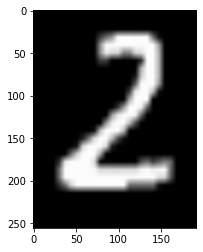

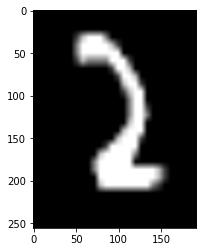

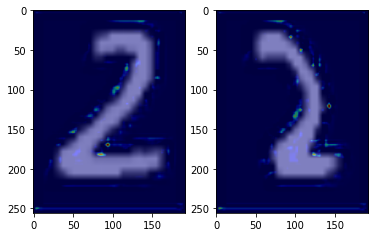

In [71]:
save_PATH='/content/drive/MyDrive/PhD/testing_weight/MNIST_GPUnet.pt'

model = GPUnet(printOn=False, regression=True)
model.to(device)
fc_weight = model.fc.weight.tolist()[0]
checkpoint = torch.load(save_PATH)
model.load_state_dict(checkpoint['model_state_dict'])

target_layers = [model.conv7]

count = 0
for image, label in mnivalloader:
  show_grad_cam(model, target_layers, image)
  count+=1
  if count==1:
    break